# Weld Defect Detection

The goal is to use (unsupervised) image segmentation to locate possible defects in x-ray scans of weld.

Possible Tools:
* OpenCV
* CGAL
* Sklearn.Cluster

The Use Case is to provide to aid to a human labelling or a weld scan review:
* The defects are the black cracks and blobs in the grey weld
* 100% accuracy not required.
* It suffices to provide hints “where to look” 


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

In [ ]:
# Function to apply a Gabor filter
# This function creates a Gabor kernel with specified parameters and applies it to the image
def apply_gabor_filter(image, ksize=10, sigma=5.0, theta=np.pi/2, lambd=10.0, gamma=0.5):
    gabor_kernel = cv2.getGaborKernel((ksize, ksize), sigma, theta, lambd, gamma, 0, ktype=cv2.CV_32F)
    filtered_image = cv2.filter2D(image, cv2.CV_8UC3, gabor_kernel)
    return filtered_image

In [100]:
# Function to detect blobs using Laplacian of Gaussian (LoG) approach
# This function first applies Gaussian smoothing to reduce noise
# Then it uses the Laplacian operator, a second-order derivative operator, to detect edges and blobs
# Finally, it applies a binary threshold to convert the result into a binary image highlighting the blobs
def detect_blobs_log(image):
    # Apply Gaussian blur to reduce noise and smooth the image
    blurred_image = cv2.GaussianBlur(image, ksize=(5, 5), sigmaX=0)
    
    # Apply Laplacian of Gaussian to detect edges and blobs
    log_image = cv2.Laplacian(src=blurred_image, ddepth=cv2.CV_64F, ksize=5)
    log_image = cv2.convertScaleAbs(log_image)
    
    # Apply binary threshold to convert the LoG response into a binary image for blob detection
    _, thresholded = cv2.threshold(src=log_image, thresh=50, maxval=255, type=cv2.THRESH_BINARY)
    
    return log_image, thresholded

In [ ]:
# Function to process a single image
# This function loads an image, applies the Gabor filter to emphasize horizontal edges,
# and then detects blobs using the Laplacian of Gaussian (LoG) approach
def process_image(image_path):
    # Load the image in grayscale
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Check if the image was loaded correctly
    if image is None:
        print(f"Failed to load image: {image_path}")
        return None, None, None, None

    # Apply Gabor filter to emphasize horizontal edges
    gabor_image = apply_gabor_filter(image, theta=np.pi/2)

    # Detect blobs using Laplacian of Gaussian (LoG)
    log_image, thresholded_blobs = detect_blobs_log(gabor_image)

    return image, gabor_image, log_image, thresholded_blobs

Processing image: Welds/W0001/W0001_0008.png


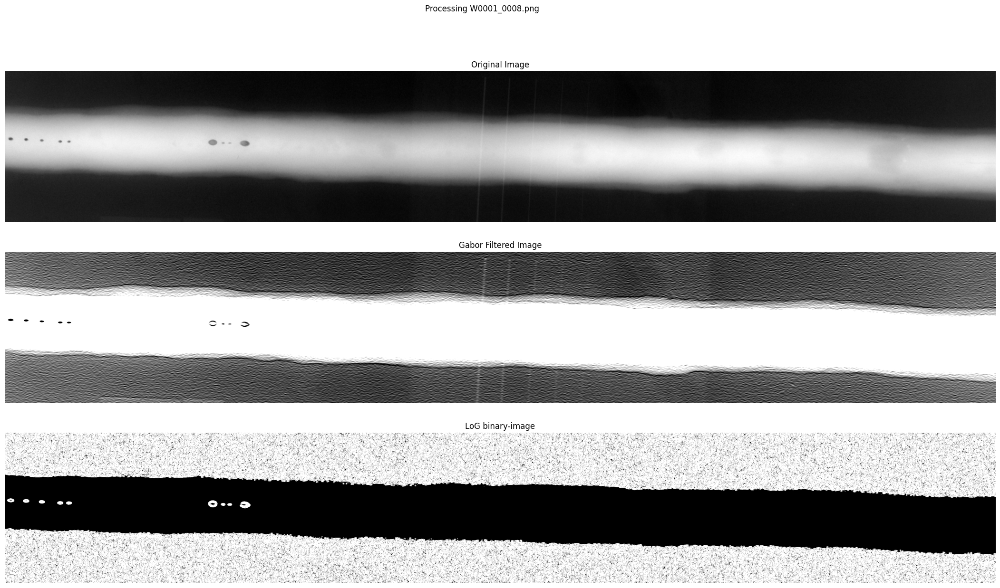

Processing image: Welds/W0001/W0001_0009.png


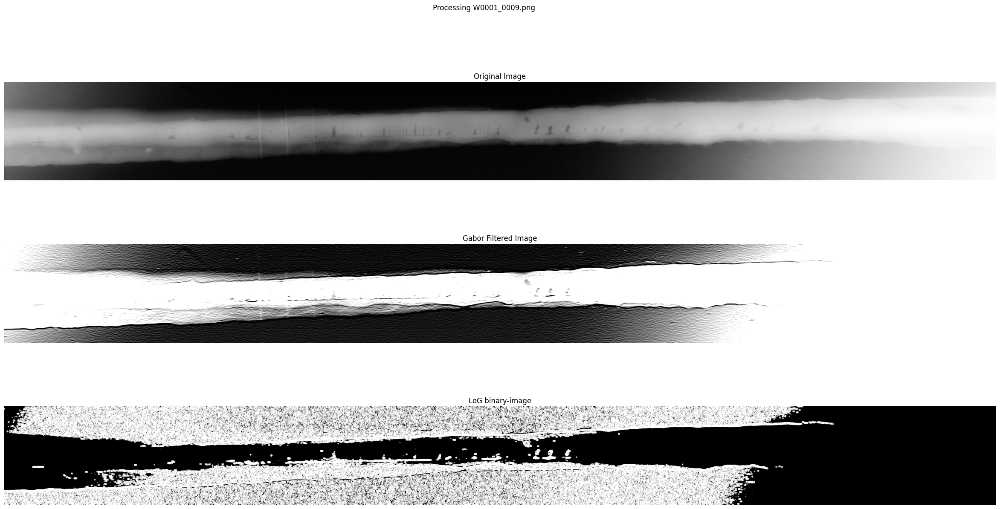

Processing image: Welds/W0001/W0001_0001.png


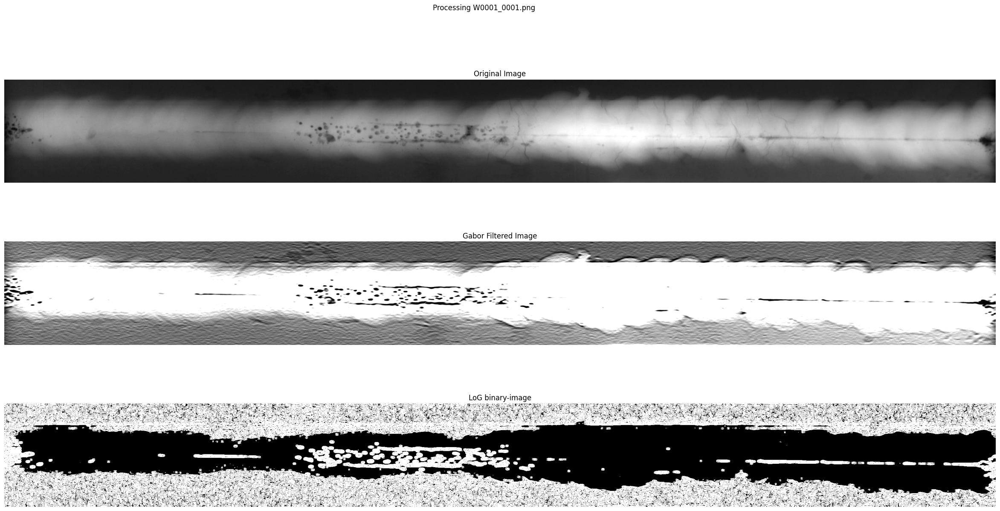

Processing image: Welds/W0001/W0001_0002.png


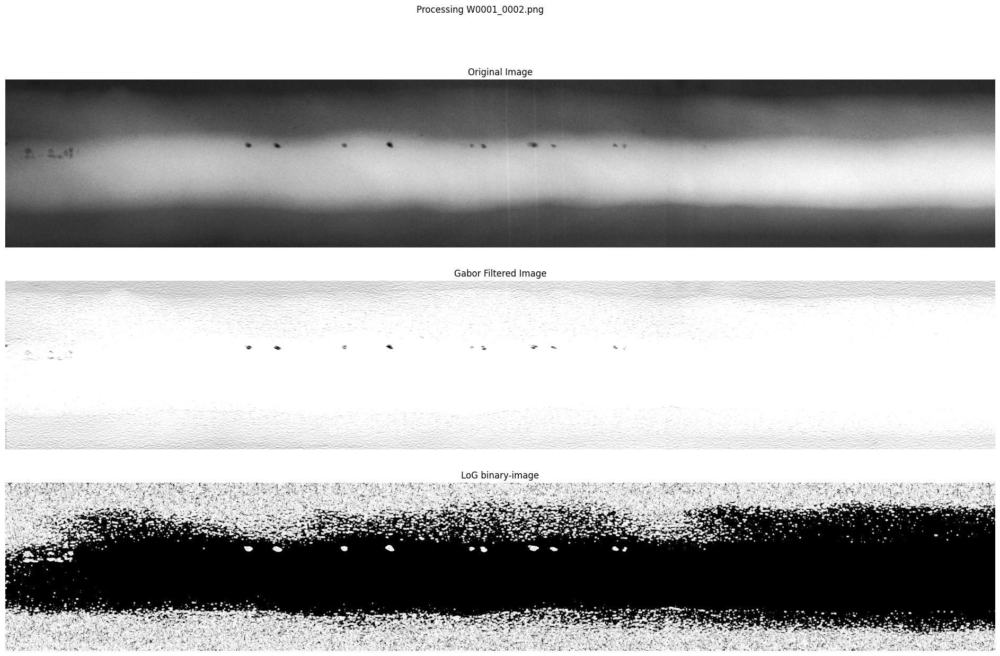

Processing image: Welds/W0001/W0001_0003.png


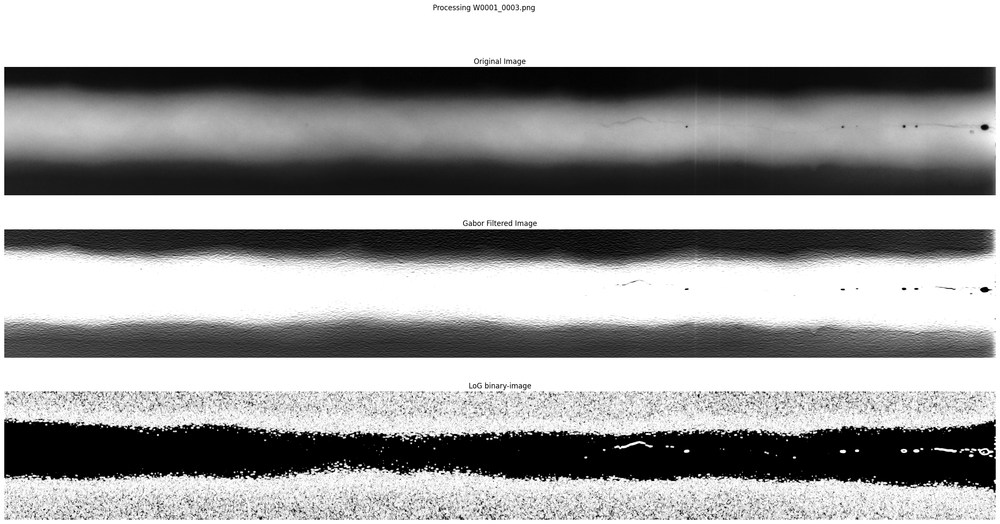

Processing image: Welds/W0001/W0001_0007.png


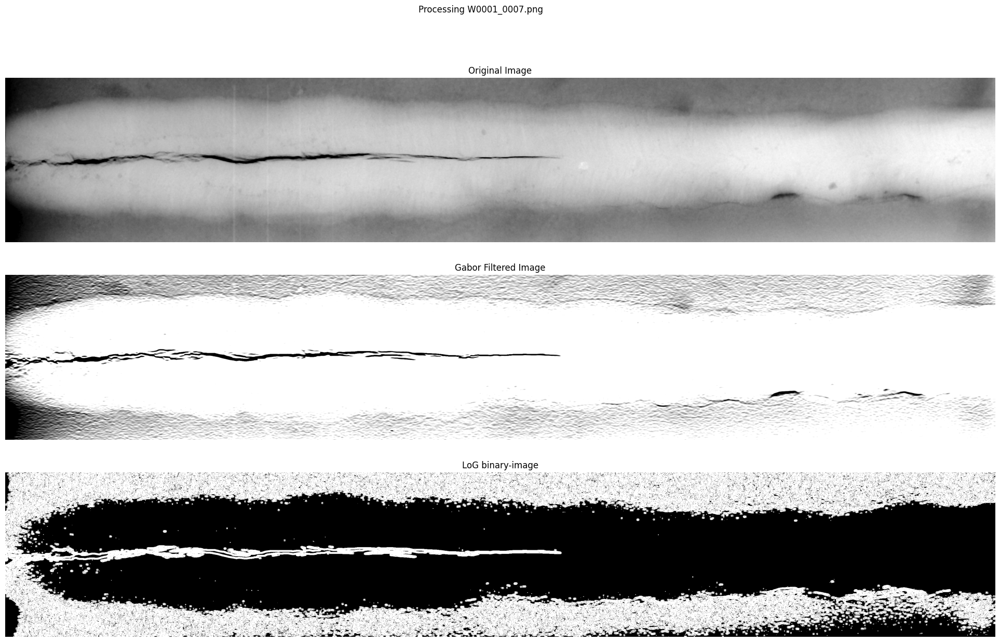

Processing image: Welds/W0001/W0001_0006.png


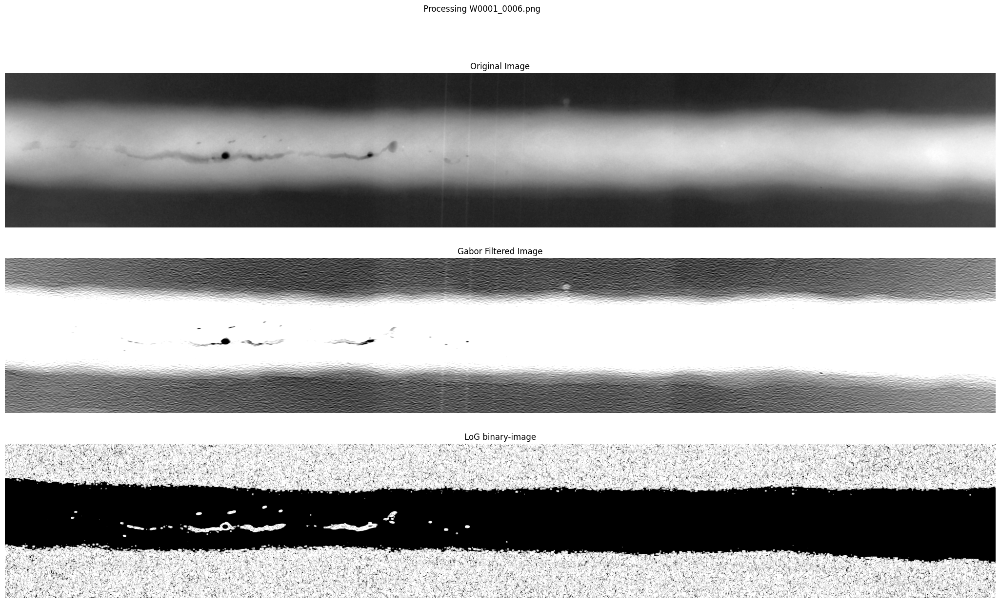

Processing image: Welds/W0001/W0001_0004.png


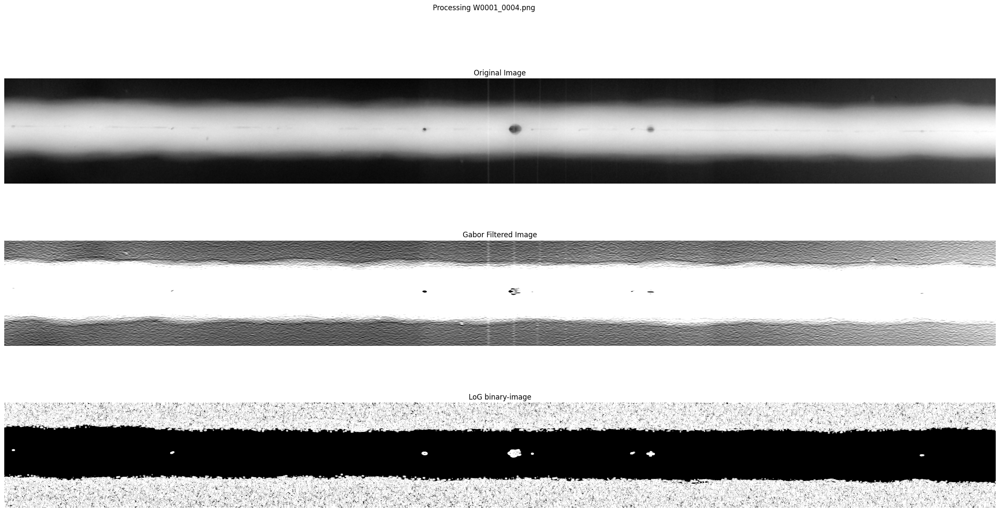

Processing image: Welds/W0001/W0001_0010.png


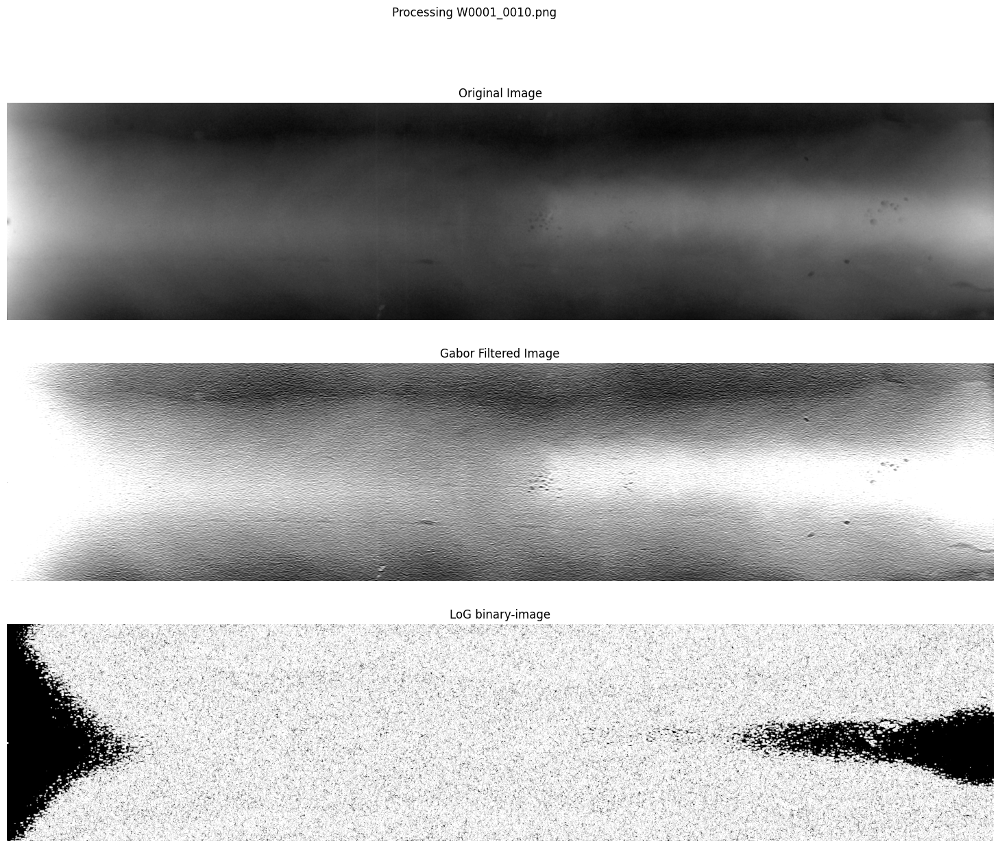

Processing image: Welds/W0001/W0001_0005.png


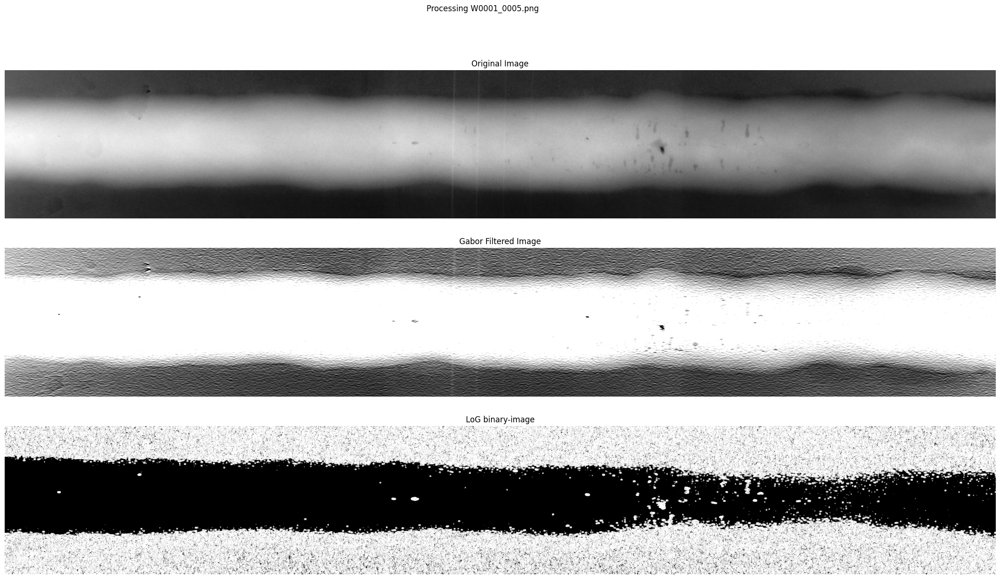

In [106]:
# Directory containing images
image_dir = 'Welds/W0001'

# Verify the directory exists
if not os.path.isdir(image_dir):
    print(f"Directory not found: {image_dir}")
else:
    # Get list of image files
    image_files = [f for f in os.listdir(image_dir) if f.endswith('.png') or f.endswith('.jpg')]

    # Check if images are found
    if not image_files:
        print(f"No image files found in directory: {image_dir}")
    else:
        # Process each image and display the results
        for image_file in image_files[:]:  # Limit to the first 5 images for display
            image_path = os.path.join(image_dir, image_file)
            print(f"Processing image: {image_path}")
            original, gabor_image, log_image, thresholded_blobs = process_image(image_path)

            if original is None:
                continue

            # Display the original and processed images
            plt.figure(figsize=(30, 14))  # Changed figsize to accommodate vertical layout

            plt.subplot(3, 1, 1)
            plt.title('Original Image')
            plt.imshow(original, cmap='gray')
            plt.axis('off')

            plt.subplot(3, 1, 2)
            plt.title('Gabor Filtered Image')
            plt.imshow(gabor_image, cmap='gray')
            plt.axis('off')

            # plt.subplot(4, 1, 3)
            # plt.title('LoG Image')
            # plt.imshow(log_image, cmap='gray')
            # plt.axis('off')

            plt.subplot(3, 1, 3)
            plt.title('LoG binary-image')
            plt.imshow(thresholded_blobs, cmap='gray')
            plt.axis('off')

            plt.suptitle(f"Processing {image_file}")
            plt.show()
